# BinBuddy Model Trial: EfficientNetV2_B2 (64 Batch)

### Model Created by BinBuddy ML Learning Path members:
- **M195B4KY2175** – Kent Cristopher, Universitas Bunda Mulia, ML - Active
- **M195B4KX0373** – Alicia Silvia, Universitas Bunda Mulia, ML - Active
- **M195B4KX4287** – Tamara, Universitas Bunda Mulia, ML - Active

## Model Results

### Transfer Learning (inference mode; lr=1.0e-3)
- **Train Accuracy**: 90.10%  
- **Train Loss**: 0.3007  
- **Validation Accuracy**: 94.36%  
- **Validation Loss**: 0.1829  

### Fine Tuning (pretrained model unfreezed; lr=8.0e-6)
- **Train Accuracy**: 95.97%  
- **Train Loss**: 0.1166  
- **Validation Accuracy**: 96.25%  
- **Validation Loss**: 0.1160

Hyperparameter tuning was unavailable due to time-cost concerning other parts of the project.

## Import Packages & Load Dataset

In [ ]:
# !pip install keras_tuner

In [ ]:
!pip install tensorboard

In [ ]:
!rm -r logs

rm: cannot remove 'logs': No such file or directory


In [ ]:
# IMPORT TENSORFLOW
import tensorflow as tf

# IMPORT KERAS
import keras
from keras import regularizers
from keras.applications import EfficientNetV2B2
from keras.callbacks import Callback, TensorBoard, EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
# import keras_tuner as kt

# IMPORT OTHERS
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import confusion_matrix
import seaborn as sns

from io import BytesIO

In [ ]:
!git clone https://github.com/GitKentC/dataset.git

Cloning into 'dataset'...
remote: Enumerating objects: 43296, done.
remote: Counting objects: 100% (358/358), done.
remote: Compressing objects: 100% (239/239), done.
remote: Total 43296 (delta 125), reused 350 (delta 119), pack-reused 42938 (from 1)
Receiving objects: 100% (43296/43296), 1.13 GiB | 16.65 MiB/s, done.
Resolving deltas: 100% (291/291), done.
Updating files: 100% (172069/172069), done.


## Loading Data (RUN THIS ON PREDICT)

In [ ]:
# """ DATASET VARIABLES (FOR LOCAL)"""
# DATASET_NAME = 'garbage_concat_lite' # 'garbage_classification' or 'garbage_concat' or 'garbage_concat_lite'
# DATASET_DIR = f'../dataset/dupe_cleaned/{DATASET_NAME}'
# TRAIN_DIR = f'../dataset/split/{DATASET_NAME}/train'
# VALIDATION_DIR = f'../dataset/split/{DATASET_NAME}/validation'
# TEST_DIR = f'../dataset/split/{DATASET_NAME}/test'

In [ ]:
"""
DATASET VARIABLES (FOR COLAB)
1. garbage_classification (10 classes)
2. garbage_classification_lite (reduced to 1250 images max for each class; 10 classes)
3. garbage_classification_experiment (experimental dataset; removed overexposed images; 10 classes (max 1250 images))
4. garbage_concat (17 classes)
5. garbage_concat_lite (reduced to 850 images max for each class; 17 classes)
"""

DATASET_NAME = 'garbage_classification_experiment'
DATASET_DIR = f'/content/dataset/dupe_cleaned/{DATASET_NAME}'
TRAIN_DIR = f'/content/dataset/split/{DATASET_NAME}/train'
VALIDATION_DIR = f'/content/dataset/split/{DATASET_NAME}/validation'
TEST_DIR = f'/content/dataset/split/{DATASET_NAME}/test'

In [ ]:
""" Change this to match pre-trained models input; for consistency """
IMAGE_SIZE:tuple[int,int] = (256, 256)

BATCH_SIZE:int = 64                     # try testing this
LABEL_MODE:str = 'categorical'
COLOR_MODE:str = 'rgb'                 # accepts 'grayscale', 'rgb', and 'rgba' only
VALIDATION_SPLIT:float = 0.2           # try testing this
SEED:int               = 42

def load_datasets_cleaned():
    """ Function to load from cleaned dataset; customizable """
    train_dataset = tf.keras.utils.image_dataset_from_directory(
        DATASET_DIR,
        subset     = 'training',
        image_size = IMAGE_SIZE,
        batch_size = BATCH_SIZE,
        label_mode = LABEL_MODE,
        color_mode = COLOR_MODE,
        validation_split = VALIDATION_SPLIT,
        seed             = SEED,
        pad_to_aspect_ratio=True,
        )

    validation_dataset = tf.keras.utils.image_dataset_from_directory(
        DATASET_DIR,
        subset     = 'validation',
        image_size = IMAGE_SIZE,
        batch_size = BATCH_SIZE,
        label_mode = LABEL_MODE,
        color_mode = COLOR_MODE,
        validation_split = VALIDATION_SPLIT,
        seed             = SEED,
        pad_to_aspect_ratio=True,
        )

    return train_dataset, validation_dataset

def load_datasets_split():
    """ Function to load from cleaned, splitted dataset  """
    train_dataset = tf.keras.utils.image_dataset_from_directory(
        TRAIN_DIR,
        image_size = IMAGE_SIZE,
        batch_size = BATCH_SIZE,
        label_mode = LABEL_MODE,
        color_mode = COLOR_MODE,
        pad_to_aspect_ratio=True,
    )

    validation_dataset = tf.keras.utils.image_dataset_from_directory(
        VALIDATION_DIR,
        image_size = IMAGE_SIZE,
        batch_size = BATCH_SIZE,
        label_mode = LABEL_MODE,
        color_mode = COLOR_MODE,
        pad_to_aspect_ratio=True,
    )

    test_dataset = tf.keras.utils.image_dataset_from_directory(
        TEST_DIR,
        image_size = IMAGE_SIZE,
        batch_size = BATCH_SIZE,
        label_mode = LABEL_MODE,
        color_mode = COLOR_MODE,
        pad_to_aspect_ratio=True,
    )

    return train_dataset, validation_dataset, test_dataset

In [ ]:
""" Create datasets """
# train_ds, val_ds = load_datasets_cleaned()
train_ds, val_ds, test_ds = load_datasets_split()

Found 6828 files belonging to 10 classes.
Found 1949 files belonging to 10 classes.
Found 982 files belonging to 10 classes.


In [ ]:
print(f"In train ds there is: {len(train_ds)} batches of {BATCH_SIZE} consisting of ~{len(train_ds)*BATCH_SIZE} images!")

In train ds there is: 107 batches of 64 consisting of ~6848 images!


In [ ]:
for images, labels in train_ds.take(1):
    # Convert the first image to a NumPy array
    image_array = images[0].numpy()
    # Calculate the size of a single image in bytes
    image_size_bytes = image_array.nbytes
    # Determine the batch size
    batch_size = images.shape[0]
    # Calculate the total size of the batch in bytes
    batch_size_bytes = image_size_bytes * batch_size
    print(f"Size of each image: {image_size_bytes/1e6:.4f} MB")
    print(f"Number of images in batch: {batch_size}")
    print(f"Total size of the batch: {batch_size_bytes/1e6:.2f} MB")

Size of each image: 0.7864 MB
Number of images in batch: 64
Total size of the batch: 50.33 MB


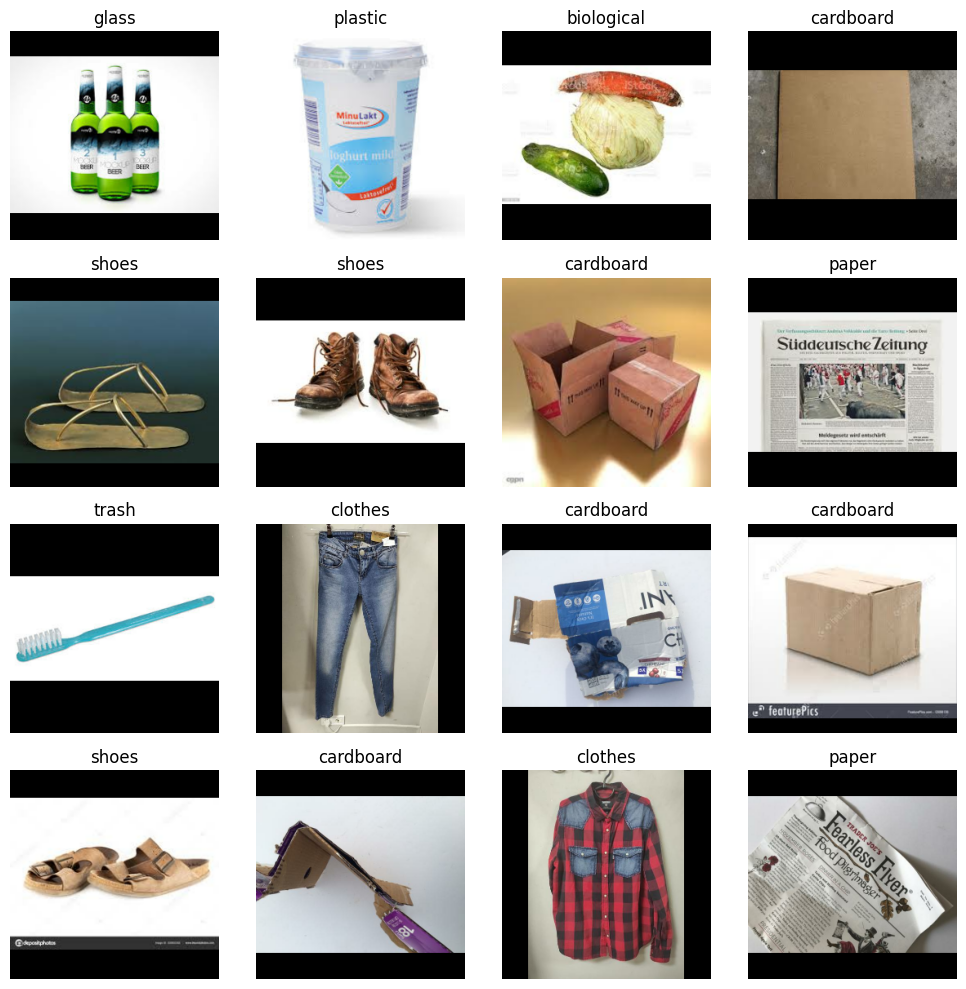

In [ ]:
id2label = {i: class_name for i, class_name in enumerate(train_ds.class_names)}

images, labels = next(iter(train_ds))

selected_images, selected_labels = images[:16], labels[:16]

fig, axes = plt.subplots(4, 4, figsize=(10, 10))

for i, ax in enumerate(axes.flat):
    ax.imshow(selected_images[i].numpy().astype("uint8"))
    ax.axis('off')  # Turn off axis

    label_index = tf.argmax(selected_labels[i]).numpy() if len(selected_labels.shape) > 1 else selected_labels[i].numpy().item()

    class_name = id2label[label_index]

    ax.set_title(class_name)

plt.tight_layout()
plt.show()


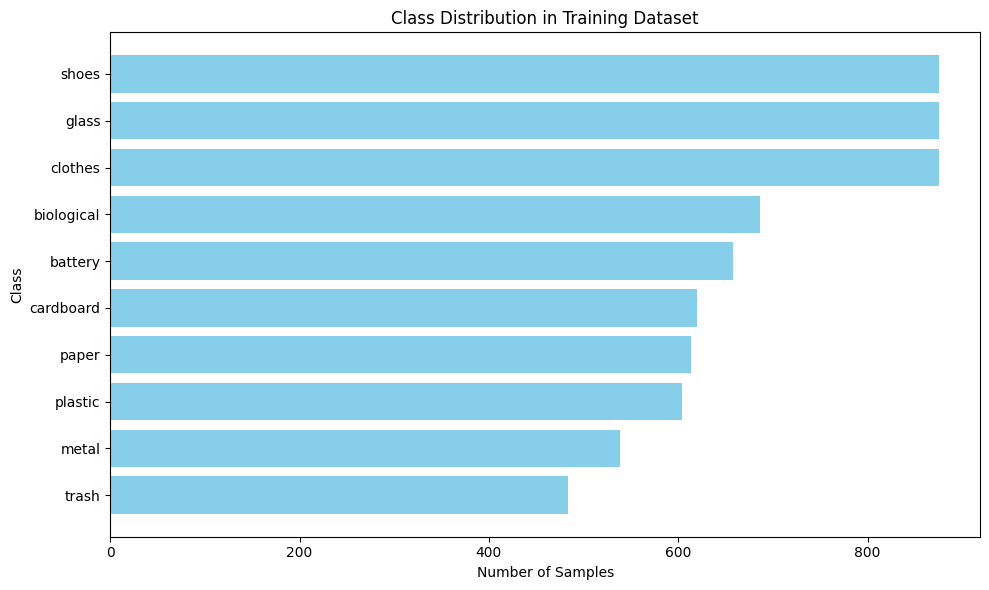

In [ ]:
def plot_class_distribution(train_ds, id2label):
    # Initialize a dictionary to store class counts
    class_counts = {class_name: 0 for class_name in id2label.values()}

    for _, labels in train_ds:
        for label in labels.numpy():
            class_index = tf.argmax(label).numpy() if len(label.shape) > 0 else label
            class_name = id2label[class_index]
            class_counts[class_name] += 1

    sorted_classes = sorted(class_counts.items(), key=lambda x: x[1])
    sorted_class_names, sorted_class_frequencies = zip(*sorted_classes)

    # Plot the class distribution
    plt.figure(figsize=(10, 6))
    plt.barh(sorted_class_names, sorted_class_frequencies, color='skyblue')
    plt.xlabel('Number of Samples')
    plt.ylabel('Class')
    plt.title('Class Distribution in Training Dataset')
    plt.tight_layout()
    plt.show()

id2label = {i: class_name for i, class_name in enumerate(train_ds.class_names)}

plot_class_distribution(train_ds, id2label)


Our data is slightly imbalanced since we controlled it to max 1250 images per classes, using compute weights should be enough without affecting much of the performance. (will not use sampling since we don't have enough data) <br>-Kent

## Transforming Data (RUN ON PREDICT)

In [ ]:
""" Preprocess the data  """
def preprocess(image, label):
    """ Read the docs in https://github.com/keras-team/keras/tree/master/keras/src/applications for more info """
    image = keras.layers.Resizing(256,256,pad_to_aspect_ratio=True)(image)
    image = keras.layers.CenterCrop(224,224)(image)
    image = tf.cast(image, tf.float32)
    image = (image / 127.5) - 1
    return image, label

train_ds_prep = train_ds.map(preprocess)
val_ds_prep = val_ds.map(preprocess)
test_ds_prep = test_ds.map(preprocess)

Note: each Keras Application expects a specific kind of input preprocessing.
For EfficientNetV2, by default input preprocessing is included as a part of
the model (as a `Rescaling` layer), and thus
`keras.applications.efficientnet_v2.preprocess_input` is actually a
pass-through function. In this use case, EfficientNetV2 models expect their
inputs to be float tensors of pixels with values in the `[0, 255]` range.
At the same time, preprocessing as a part of the model (i.e. `Rescaling`
layer) can be disabled by setting `include_preprocessing` argument to `False`.
With preprocessing disabled EfficientNetV2 models expect their inputs to be
float tensors of pixels with values in the `[-1, 1]` range.
<br>-Kent

In [ ]:
train_ds.element_spec[0]

TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None)

In [ ]:
train_ds_prep.element_spec[0]

TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)

In [ ]:
def check_min_max(ds):
    for image_batch, label_batch in ds.take(1):
        ''' Check min-max value in dataset'''
        min_val = tf.reduce_min(image_batch).numpy()
        max_val = tf.reduce_max(image_batch).numpy()
        print(f"Min value: {min_val}, Max value: {max_val}")

check_min_max(train_ds)
print()
check_min_max(train_ds_prep)

Min value: 0.0, Max value: 255.0

Min value: -1.0, Max value: 1.0


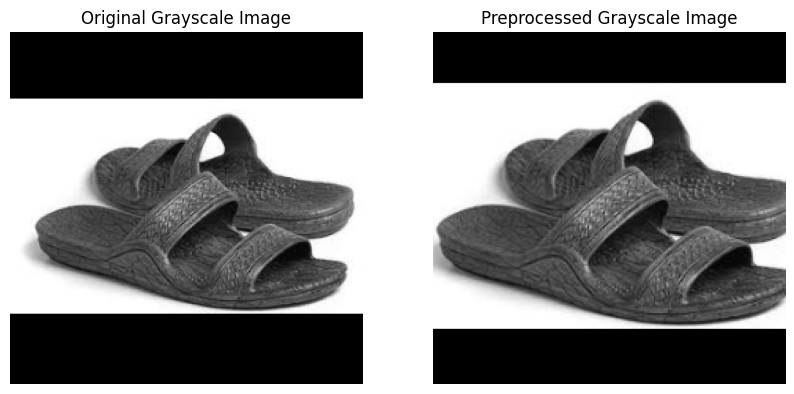

In [ ]:
sample_image = next(iter(train_ds.take(1)))

sample_image_data, sample_label = sample_image

sample_prep_data, _ = preprocess(sample_image_data, sample_label)

# Convert RGB images to grayscale by averaging across the color channels (pictures with -1 to 1 value dont make any sense in RGB -Kent)
sample_image_gray = tf.reduce_mean(sample_image_data, axis=-1)
sample_prep_gray = tf.reduce_mean(sample_prep_data, axis=-1)

fig, axs = plt.subplots(1, 2, figsize=(10, 5))

# Plot the original grayscale image
axs[0].imshow(sample_image_gray[0], cmap="gray")
axs[0].set_title("Original Grayscale Image")
axs[0].axis("off")

# Plot the preprocessed grayscale image
axs[1].imshow(sample_prep_gray[0], cmap="gray")
axs[1].set_title("Preprocessed Grayscale Image")
axs[1].axis("off")

plt.show()


In [ ]:
SHUFFLE_BUFFER_SIZE = 1000
PREFETCH_BUFFER_SIZE = tf.data.AUTOTUNE

train_ds_final = (train_ds_prep
                  .cache()
                  .shuffle(SHUFFLE_BUFFER_SIZE)
                  .prefetch(PREFETCH_BUFFER_SIZE)
                  )

val_ds_final = (val_ds_prep
                .cache()
                .prefetch(PREFETCH_BUFFER_SIZE)
                )

test_ds_final = (test_ds_prep
               .cache()
               .prefetch(PREFETCH_BUFFER_SIZE)
               )

## Preparing Inference Model

In [ ]:
pre_trained_model = EfficientNetV2B2(
    include_top=False,
    input_shape=(224,224,3),
    weights="imagenet",
    include_preprocessing=False
)

pre_trained_model.trainable = False

pre_trained_model.summary(show_trainable=True)

35839040/35839040 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step


Model: "efficientnetv2-b2"

┏━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━┓
┃ Layer (type)           ┃ Output Shape         ┃      Param # ┃ Connected to        ┃ Traina… ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━┩
│ input_layer            │ (None, 224, 224, 3)  │            0 │ -                   │    -    │
│ (InputLayer)           │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ stem_conv (Conv2D)     │ (None, 112, 112, 32) │          864 │ input_layer[0][0]   │    N    │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ stem_bn                │ (None, 112, 112, 32) │          128 │ stem_conv[0][0]     │    N    │
│ (BatchNormalization)   │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ stem_activation        │ (None, 112, 112, 32) │            0 │ stem_bn[0][0]       │    -    │
│ (Activation)           │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ block1a_project_conv   │ (None, 112, 112, 16) │        4,608 │ stem_activation[0]… │    N    │
│ (Conv2D)               │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ block1a_project_bn     │ (None, 112, 112, 16) │           64 │ block1a_project_co… │    N    │
│ (BatchNormalization)   │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ block1a_project_activ… │ (None, 112, 112, 16) │            0 │ block1a_project_bn… │    -    │
│ (Activation)           │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ block1b_project_conv   │ (None, 112, 112, 16) │        2,304 │ block1a_project_ac… │    N    │
│ (Conv2D)               │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ block1b_project_bn     │ (None, 112, 112, 16) │           64 │ block1b_project_co… │    N    │
│ (BatchNormalization)   │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ block1b_project_activ… │ (None, 112, 112, 16) │            0 │ block1b_project_bn… │    -    │
│ (Activation)           │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ block1b_drop (Dropout) │ (None, 112, 112, 16) │            0 │ block1b_project_ac… │    -    │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ block1b_add (Add)      │ (None, 112, 112, 16) │            0 │ block1b_drop[0][0], │    -    │
│                        │                      │              │ block1a_project_ac… │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ block2a_expand_conv    │ (None, 56, 56, 64)   │        9,216 │ block1b_add[0][0]   │    N    │
│ (Conv2D)               │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ block2a_expand_bn      │ (None, 56, 56, 64)   │          256 │ block2a_expand_con… │    N    │
│ (BatchNormalization) 

 Total params: 8,769,374 (33.45 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 8,769,374 (33.45 MB)

In [ ]:
last_output = pre_trained_model.output

print(last_output.shape)

(None, 7, 7, 1408)


In [ ]:
def create_augmentation_model():
    FILL_MODE = 'nearest'

    augmentation_model = tf.keras.Sequential([
        keras.Input(shape=(224, 224, 3)),
        tf.keras.layers.RandomFlip("horizontal_and_vertical"),
        tf.keras.layers.RandomRotation(0.2, fill_mode = FILL_MODE),
        tf.keras.layers.RandomTranslation(0.2, 0.2, fill_mode = FILL_MODE),
        tf.keras.layers.RandomZoom(0.2, fill_mode = FILL_MODE),
    ])

    return augmentation_model

augmentation_model = create_augmentation_model()

In [ ]:
# def get_hp(hp):
#     """Retrieve and organize hp."""
#     hp = {
#         'dense_units': hp.Int('dense_units', min_value=256, max_value=2048, step=2, sampling='log'),
#         'dense_l2': hp.Float('dense_l2', min_value=1e-6, max_value=1e-2, sampling='log'),
#         'dropout_1': hp.Float('dropout_1', min_value=0.2, max_value=0.5, sampling='linear'),
#         'learning_rate': hp.Float('learning_rate', min_value=1e-5, max_value=3e-4, sampling='log')
#     }
#     return hp

# def create_model(hp):
#     hp = get_hp(hp)  # Get hp

#     inputs = tf.keras.Input(shape=(224, 224, 3))
#     x = augmentation_model(inputs)
#     x = pre_trained_model(x)
#     x = tf.keras.layers.GlobalAveragePooling2D()(x)

#     x = tf.keras.layers.Dense(
#         hp['dense_units'],
#         activation='relu',
#         kernel_regularizer=regularizers.l2(hp['dense_l2'])
#     )(x)

#     x = tf.keras.layers.Dropout(hp['dropout_1'])(x)
#     outputs = tf.keras.layers.Dense(12, activation='softmax')(x)

#     model = tf.keras.Model(inputs=inputs, outputs=outputs)

#     model.compile(
#         optimizer=tf.keras.optimizers.Adam(learning_rate=hp['learning_rate']),
#         loss='categorical_crossentropy',
#         metrics=['accuracy']
#     )

#     return model

In [ ]:
def create_model():
    inputs = tf.keras.Input(shape=(224, 224, 3))

    x = augmentation_model(inputs)
    x = pre_trained_model(x, training=False)
    x = tf.keras.layers.GlobalAveragePooling2D()(x)

    outputs = tf.keras.layers.Dense(10, activation='softmax')(x)

    model = tf.keras.Model(inputs = inputs, outputs = outputs)

    model.compile(
        optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3, weight_decay=1e-4),
        loss = 'categorical_crossentropy',
        metrics = ['accuracy']
    )

    return model

In [ ]:
# model = create_model(kt.HyperParameters())
model = create_model()
model.summary(show_trainable=True)

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━┓
┃ Layer (type)                        ┃ Output Shape                 ┃       Param # ┃ Traina… ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━┩
│ input_layer_2 (InputLayer)          │ (None, 224, 224, 3)          │             0 │    -    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│ sequential (Sequential)             │ (None, 224, 224, 3)          │             0 │    -    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│ efficientnetv2-b2 (Functional)      │ (None, 7, 7, 1408)           │     8,769,374 │    N    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│ global_average_pooling2d            │ (None, 1408)                 │             0 │    -    │
│ (GlobalAveragePooling2D)            │                              │               │         │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│ dense (Dense)                       │ (None, 10)                   │        14,090 │    Y    │
└─────────────────────────────────────┴──────────────────────────────┴───────────────┴─────────┘

 Total params: 8,783,464 (33.51 MB)

 Trainable params: 14,090 (55.04 KB)

 Non-trainable params: 8,769,374 (33.45 MB)

In [ ]:
"""
This code is used for handling imbalanced dataset using weights factor for each class,
the class with low quantity of data gets weight boost and vice versa.
"""
import gc
from sklearn.utils.class_weight import compute_class_weight

all_labels = tf.concat([labels for _, labels in train_ds], axis=0).numpy()

print(f"Length of labels: {len(all_labels)}")

class_indices = np.argmax(all_labels, axis=1)

del all_labels
gc.collect()

class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(class_indices),
    y=class_indices
)
class_weights = dict(enumerate(class_weights))

print(class_weights)

Length of labels: 6828
{0: 1.0376899696048631, 1: 0.99533527696793, 2: 1.1012903225806452, 3: 0.7803428571428571, 4: 0.7803428571428571, 5: 1.2691449814126394, 6: 1.1138662316476347, 7: 1.1304635761589403, 8: 0.7803428571428571, 9: 1.4107438016528926}


In [ ]:
# Define the log directory
log_dir = 'logs/inference'

early_stopping = EarlyStopping(
    monitor='val_loss',       # Monitors the validation loss
    min_delta=0.001,          # Minimum change to qualify as an improvement
    patience=15,              # Number of epochs to wait for improvement; will increase for mobile net (25-45)
    verbose=1,                # Verbosity mode
    mode='min',               # Stop when the monitored quantity has stopped decreasing
    restore_best_weights=True
)

reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.1,
    patience=5, # will increase for mobilenet (10-20)
    min_lr=1e-10,
    verbose=1
)

tensorboard_callback = TensorBoard(log_dir=log_dir, histogram_freq=1)

In [ ]:
history = model.fit(train_ds_final,
                    validation_data = val_ds_final,
                    epochs = 100,
                    verbose = 2,
                    class_weight=class_weights,
                    callbacks = [tensorboard_callback,
                                 reduce_lr,
                                 early_stopping]
                    )

Epoch 1/100
107/107 - 63s - 593ms/step - accuracy: 0.6984 - loss: 1.0774 - val_accuracy: 0.8876 - val_loss: 0.4666 - learning_rate: 0.0010
Epoch 2/100
107/107 - 58s - 544ms/step - accuracy: 0.8146 - loss: 0.6155 - val_accuracy: 0.9112 - val_loss: 0.3449 - learning_rate: 0.0010
Epoch 3/100
107/107 - 26s - 246ms/step - accuracy: 0.8385 - loss: 0.5257 - val_accuracy: 0.9164 - val_loss: 0.3039 - learning_rate: 0.0010
Epoch 4/100
107/107 - 40s - 375ms/step - accuracy: 0.8430 - loss: 0.4903 - val_accuracy: 0.9282 - val_loss: 0.2736 - learning_rate: 0.0010
Epoch 5/100
107/107 - 26s - 239ms/step - accuracy: 0.8568 - loss: 0.4471 - val_accuracy: 0.9271 - val_loss: 0.2576 - learning_rate: 0.0010
Epoch 6/100
107/107 - 42s - 391ms/step - accuracy: 0.8533 - loss: 0.4447 - val_accuracy: 0.9297 - val_loss: 0.2455 - learning_rate: 0.0010
Epoch 7/100
107/107 - 27s - 249ms/step - accuracy: 0.8666 - loss: 0.4130 - val_accuracy: 0.9333 - val_loss: 0.2347 - learning_rate: 0.0010
Epoch 8/100
107/107 - 40s -

In [ ]:
# tuner = kt.BayesianOptimization(
#     hypermodel=create_model,
#     objective='val_accuracy',
#     max_trials=75,
#     executions_per_trial=1,
#     overwrite=True,
#     directory='hypertuning',
#     project_name='efficientnetv2b2_hypertune_t1'
# )

# tuner.search(
#     train_ds_final,
#     validation_data=val_ds_final,
#     epochs=100,
#     callbacks=[tensorboard_callback, early_stopping]
# )

In [ ]:
# # Get the best hyperparameters from the search
# best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]

# # Print the best hyperparameters
# print("Best hyperparameters:")
# for key, value in best_hps.values.items():
#     print(f"{key}: {value}")

# # Rebuild the model with the best hyperparameters
# best_model = tuner.hypermodel.build(best_hps)

# # Optionally, you can train the best model on the full dataset
# history = best_model.fit(
#     train_ds_final,
#     validation_data=val_ds_final,
#     epochs=100,
#     callbacks=[tensorboard_callback, early_stopping]
# )

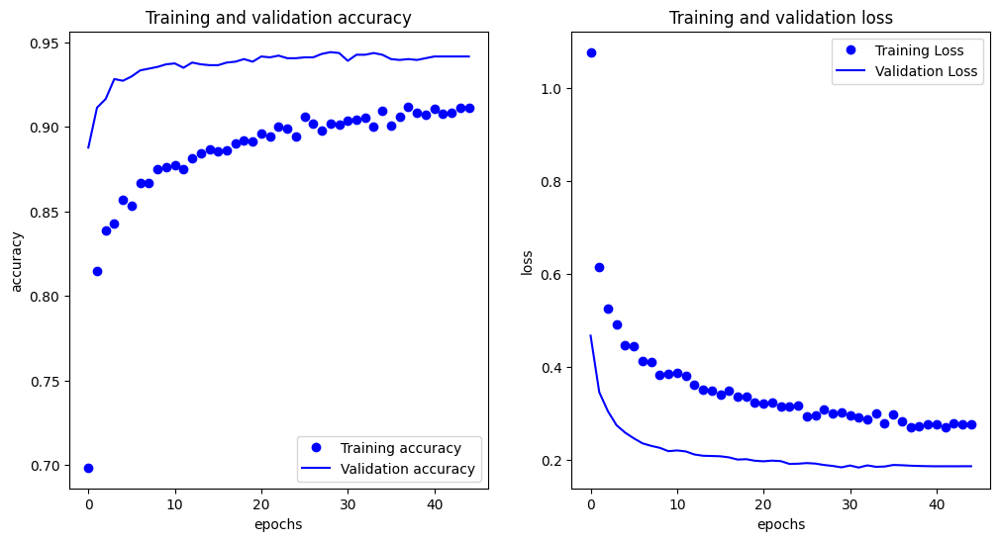

In [ ]:
def plot_loss_acc(history):
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    epochs = range(len(acc))

    fig, ax = plt.subplots(1,2, figsize=(12, 6))
    ax[0].plot(epochs, acc, 'bo', label='Training accuracy')
    ax[0].plot(epochs, val_acc, 'b', label='Validation accuracy')
    ax[0].set_title('Training and validation accuracy')
    ax[0].set_xlabel('epochs')
    ax[0].set_ylabel('accuracy')
    ax[0].legend()

    ax[1].plot(epochs, loss, 'bo', label='Training Loss')
    ax[1].plot(epochs, val_loss, 'b', label='Validation Loss')
    ax[1].set_title('Training and validation loss')
    ax[1].set_xlabel('epochs')
    ax[1].set_ylabel('loss')
    ax[1].legend()

    plt.show()

plot_loss_acc(history)

In [ ]:
%load_ext tensorboard
%tensorboard --logdir=logs/inference

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

In [ ]:
pre_trained_model.trainable = True
# Ensure all BN layers are non-trainable (based on Keras inference & finetuning guide -Kent)
for layer in pre_trained_model.layers:
    if isinstance(layer, tf.keras.layers.BatchNormalization):
        layer.trainable = False  # Force BN layers to remain non-trainable
pre_trained_model.summary(show_trainable=True)

Model: "efficientnetv2-b2"

┏━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━┓
┃ Layer (type)           ┃ Output Shape         ┃      Param # ┃ Connected to        ┃ Traina… ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━┩
│ input_layer            │ (None, 224, 224, 3)  │            0 │ -                   │    -    │
│ (InputLayer)           │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ stem_conv (Conv2D)     │ (None, 112, 112, 32) │          864 │ input_layer[0][0]   │    Y    │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ stem_bn                │ (None, 112, 112, 32) │          128 │ stem_conv[0][0]     │    N    │
│ (BatchNormalization)   │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ stem_activation        │ (None, 112, 112, 32) │            0 │ stem_bn[0][0]       │    -    │
│ (Activation)           │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ block1a_project_conv   │ (None, 112, 112, 16) │        4,608 │ stem_activation[0]… │    Y    │
│ (Conv2D)               │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ block1a_project_bn     │ (None, 112, 112, 16) │           64 │ block1a_project_co… │    N    │
│ (BatchNormalization)   │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ block1a_project_activ… │ (None, 112, 112, 16) │            0 │ block1a_project_bn… │    -    │
│ (Activation)           │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ block1b_project_conv   │ (None, 112, 112, 16) │        2,304 │ block1a_project_ac… │    Y    │
│ (Conv2D)               │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ block1b_project_bn     │ (None, 112, 112, 16) │           64 │ block1b_project_co… │    N    │
│ (BatchNormalization)   │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ block1b_project_activ… │ (None, 112, 112, 16) │            0 │ block1b_project_bn… │    -    │
│ (Activation)           │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ block1b_drop (Dropout) │ (None, 112, 112, 16) │            0 │ block1b_project_ac… │    -    │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ block1b_add (Add)      │ (None, 112, 112, 16) │            0 │ block1b_drop[0][0], │    -    │
│                        │                      │              │ block1a_project_ac… │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ block2a_expand_conv    │ (None, 56, 56, 64)   │        9,216 │ block1b_add[0][0]   │    Y    │
│ (Conv2D)               │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ block2a_expand_bn      │ (None, 56, 56, 64)   │          256 │ block2a_expand_con… │    N    │
│ (BatchNormalization) 

 Total params: 8,769,374 (33.45 MB)

 Trainable params: 8,604,798 (32.82 MB)

 Non-trainable params: 164,576 (642.88 KB)

In [ ]:
model.compile(
    optimizer = tf.keras.optimizers.Adam(learning_rate=8e-6, weight_decay=1e-4),
    loss = 'categorical_crossentropy',
    metrics = ['accuracy']
)

history = model.fit(train_ds_final,
                    validation_data = val_ds_final,
                    epochs = 15,
                    verbose = 2,
                    class_weight=class_weights,
                    callbacks = [reduce_lr,
                                 early_stopping]
                    )

Epoch 1/15
107/107 - 96s - 896ms/step - accuracy: 0.9083 - loss: 0.2730 - val_accuracy: 0.9487 - val_loss: 0.1677 - learning_rate: 8.0000e-06
Epoch 2/15
107/107 - 77s - 720ms/step - accuracy: 0.9197 - loss: 0.2363 - val_accuracy: 0.9487 - val_loss: 0.1591 - learning_rate: 8.0000e-06
Epoch 3/15
107/107 - 54s - 503ms/step - accuracy: 0.9246 - loss: 0.2262 - val_accuracy: 0.9523 - val_loss: 0.1549 - learning_rate: 8.0000e-06
Epoch 4/15
107/107 - 54s - 502ms/step - accuracy: 0.9347 - loss: 0.1981 - val_accuracy: 0.9554 - val_loss: 0.1428 - learning_rate: 8.0000e-06
Epoch 5/15
107/107 - 53s - 498ms/step - accuracy: 0.9366 - loss: 0.1917 - val_accuracy: 0.9543 - val_loss: 0.1429 - learning_rate: 8.0000e-06
Epoch 6/15
107/107 - 54s - 500ms/step - accuracy: 0.9417 - loss: 0.1809 - val_accuracy: 0.9528 - val_loss: 0.1413 - learning_rate: 8.0000e-06
Epoch 7/15
107/107 - 54s - 501ms/step - accuracy: 0.9394 - loss: 0.1739 - val_accuracy: 0.9554 - val_loss: 0.1356 - learning_rate: 8.0000e-06
Epoch 

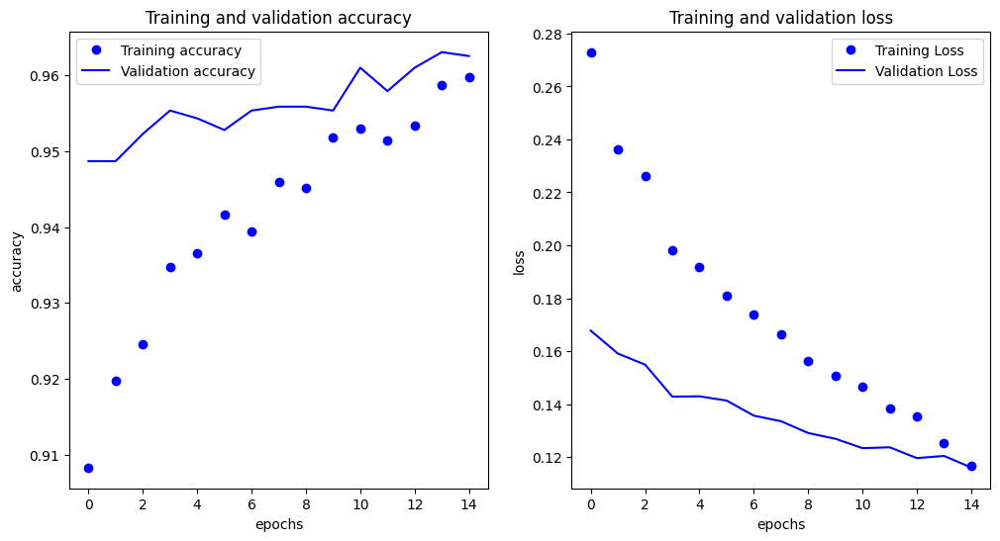

In [ ]:
plot_loss_acc(history)

In [ ]:
true_labels = np.concatenate([y for x, y in test_ds_final])

# Convert true_labels from one-hot encoding to class indices
true_labels = np.argmax(true_labels, axis=1)

pred_probs = model.predict(test_ds_final)

pred_labels = np.argmax(pred_probs, axis=1)

16/16 ━━━━━━━━━━━━━━━━━━━━ 10s 415ms/step


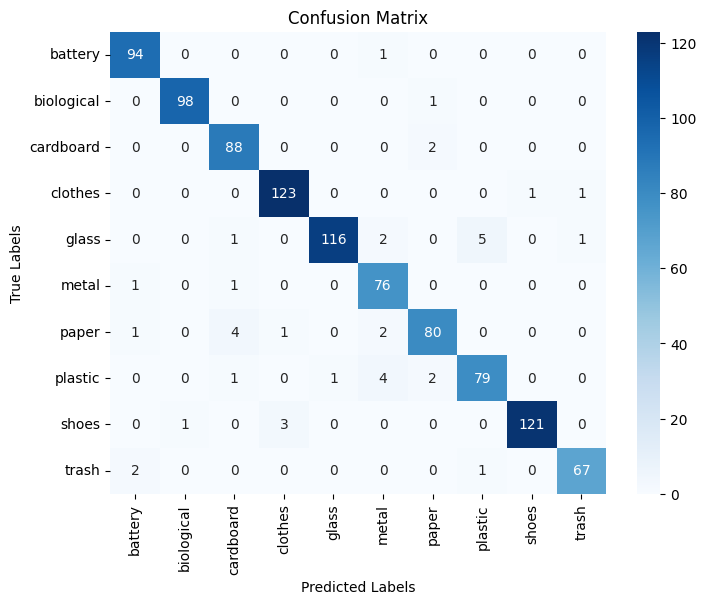

In [ ]:
cm = confusion_matrix(true_labels, pred_labels)

# Plot the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=test_ds.class_names, yticklabels=test_ds.class_names)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

In [ ]:
loss, acc = model.evaluate(test_ds_final)

print("Test loss : ", loss)
print("Test acc  : ", acc)

16/16 ━━━━━━━━━━━━━━━━━━━━ 8s 144ms/step - accuracy: 0.9615 - loss: 0.1134
Test loss :  0.12259276956319809
Test acc  :  0.9592667818069458


In [ ]:
model_name = "efficientnetv2b2.keras"
tf.keras.models.save_model(model, model_name)

In [ ]:
type(model)

keras.src.models.functional.Functional

In [ ]:
from google.colab import files

files.download(model_name)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## !! PREDICT AND EVALUATE FROM HERE !!

In [ ]:
# IMPORT TENSORFLOW
import tensorflow as tf

# IMPORT KERAS
import keras

# IMPORT OTHERS
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

from io import BytesIO
from PIL import Image
import io

In [ ]:
model = keras.models.load_model(model_name)

In [ ]:
def load_image(image_path):
    with open(image_path, 'rb') as file:
        image_bytes = file.read()
        pillow_img = Image.open(io.BytesIO(image_bytes))
        pillow_img = pillow_img.convert("RGB")
    return pillow_img

def transform(image):
    data = np.asarray(image)
    data = np.float32((data / 127.5) - 1)
    data = np.expand_dims(data, axis=0)

    data = keras.layers.Resizing(256, 256, pad_to_aspect_ratio=True)(data)
    data = keras.layers.CenterCrop(224, 224)(data)
    return data

In [ ]:
class_names = test_ds.class_names

print(class_names)

In [ ]:
# # UNCOMMENT TO TRY AND PREDICT AN IMAGE
# image = load_image('C:/capstone/models/asdasd.jpg')

# display(image)

# image = transform(image)

# prediction = model.predict(image)
# prediction_sort = np.argsort(prediction[0])[::-1]
# prediction_names = [class_names[i] for i in prediction_sort]
# prediction_confidence = prediction[0][prediction_sort]

# print(f"{'Rank':<6} {'Class Name':<20} {'Confidence':<12}")
# print("-" * 40)
# # Print the top 3 predictions
# for i in range(len(prediction_sort)):
#     print(f"{i+1:<6} {prediction_names[i]:<20} {prediction_confidence[i]:<12.4f}")

## **CODE NOT USED BELOW**

In [ ]:
# prediction = model.predict(data)

# predicted_index = prediction.argmax(axis=-1)[0]  # Get the index of the highest probability


# # Get the class name using the index
# predicted_class_name = class_names[predicted_index]

# # Print the predicted class name
# print("Predicted class:", predicted_class_name)
# print(prediction)

In [ ]:
# loaded_model = keras.models.load_model('efficientnetv2_b2_t1.keras')
# load_acc, load_loss = loaded_model.evaluate(test_ds_final)
# acc, loss = model.evaluate(test_ds_final)
# # Print the predicted class name
# print("Model prediction:")
# print(prediction)

# print("Loaded prediction:" )
# print(loaded_pred)